In [13]:
import pm4py
from pm4py.algo.discovery.temporal_profile import algorithm as temporal_profile_discovery
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
import seaborn as sns
from datetime import datetime
from datetime import timedelta

if __name__ == "__main__":
    log = pm4py.read_xes('result/148sites_240129.xes')
    temporal_profile = temporal_profile_discovery.apply(log)

log['doy']=[x.dayofyear for x in log['Timestamp']]
log['Year']=[str(x.year) for x in log['Timestamp']]

parsing log, completed traces ::   0%|          | 0/2315 [00:00<?, ?it/s]

In [8]:
def plot_ps(LG):
    fig = plt.figure(figsize=(17, 20))
    plt.axhline(y=0,color='k')
    plt.axhline(y=400,color='k')
    plt.axhline(y=800,color='k')
    plt.axhline(y=1200,color='k')
    plt.axvline(x=0,color='k')
    plt.axvline(x=365,color='k')
    plt.text(333, 4, 'Dormancy', fontsize=14, color='k')
    plt.text(328, 404, 'Senescence', fontsize=14, color='k')   
    plt.text(338, 804, 'Maturity', fontsize=14, color='k')
    plt.text(330, 1204, 'Emergence', fontsize=14, color='k')
    em=np.array(LG[LG['Activity']=='Emergence']['doy'])
    ma=np.array(LG[LG['Activity']=='Maturity']['doy'])
    se=np.array(LG[LG['Activity']=='Senescence']['doy'])
    do=np.array(LG[LG['Activity']=='Dormancy']['doy'])

    # Use the exponential steps in your calculation
    num_lines = len(LG['CaseID'].unique())

    red_to_gray = [
        (0.3, 0, 0),
        (1, 0.7, 0.7),
        (0.8, 0.8, 0.8)
    ]
    from matplotlib.colors import LinearSegmentedColormap
    custom_cmap = LinearSegmentedColormap.from_list('red_to_gray', red_to_gray, N=num_lines)
    custom_cmap = custom_cmap.reversed()

    for i,c in zip(np.argsort(ma-em),range(num_lines)):
        x=[em[i],ma[i]]
        y=[1200,800]
        plt.plot(x, y,color=custom_cmap(c), alpha=0.5)

    for i,c in zip(np.argsort(se-ma),range(num_lines)):
        x=[ma[i],se[i]]
        y=[800,400]
        plt.plot(x, y,color=custom_cmap(c), alpha=0.5)

    for i,c in zip(np.argsort(do-se),range(num_lines)):
        x=[se[i],do[i]]
        y=[400,0]
        plt.plot(x, y,color=custom_cmap(c), alpha=0.5)
    plt.axis('off')
    plt.text(180, -40, 'Day of year', fontsize=14, color='k')

    return fig

In [9]:
def plot_ps_ax(LG, ax, title=''):
    ax.axhline(y=0,color='k')
    ax.axhline(y=400,color='k')
    ax.axhline(y=800,color='k')
    ax.axhline(y=1200,color='k')
    ax.axvline(x=0,color='k')
    ax.axvline(x=365,color='k')
    ax.text(333, 4, 'Dormancy', fontsize=14, color='k')
    ax.text(328, 404, 'Senescence', fontsize=14, color='k')   
    ax.text(338, 804, 'Maturity', fontsize=14, color='k')
    ax.text(330, 1204, 'Emergence', fontsize=14, color='k')
    em=np.array(LG[LG['Activity']=='Emergence']['doy'])
    ma=np.array(LG[LG['Activity']=='Maturity']['doy'])
    se=np.array(LG[LG['Activity']=='Senescence']['doy'])
    do=np.array(LG[LG['Activity']=='Dormancy']['doy'])

    # Use the exponential steps in your calculation
    num_lines = len(LG['CaseID'].unique())

    red_to_gray = [
        (0.3, 0, 0),
        (1, 0.7, 0.7),
        (0.8, 0.8, 0.8)
    ]
    from matplotlib.colors import LinearSegmentedColormap
    custom_cmap = LinearSegmentedColormap.from_list('red_to_gray', red_to_gray, N=num_lines)
    custom_cmap = custom_cmap.reversed()

    for i,c in zip(np.argsort(ma-em),range(num_lines)):
        x=[em[i],ma[i]]
        y=[1200,800]
        ax.plot(x, y,color=custom_cmap(c), alpha=0.5)

    for i,c in zip(np.argsort(se-ma),range(num_lines)):
        x=[ma[i],se[i]]
        y=[800,400]
        ax.plot(x, y,color=custom_cmap(c), alpha=0.5)

    for i,c in zip(np.argsort(do-se),range(num_lines)):
        x=[se[i],do[i]]
        y=[400,0]
        ax.plot(x, y,color=custom_cmap(c), alpha=0.5)
    ax.axis('off')
    ax.text(180, -40, 'Day of year', fontsize=14, color='k')
    ax.set_title(title, fontsize=14)


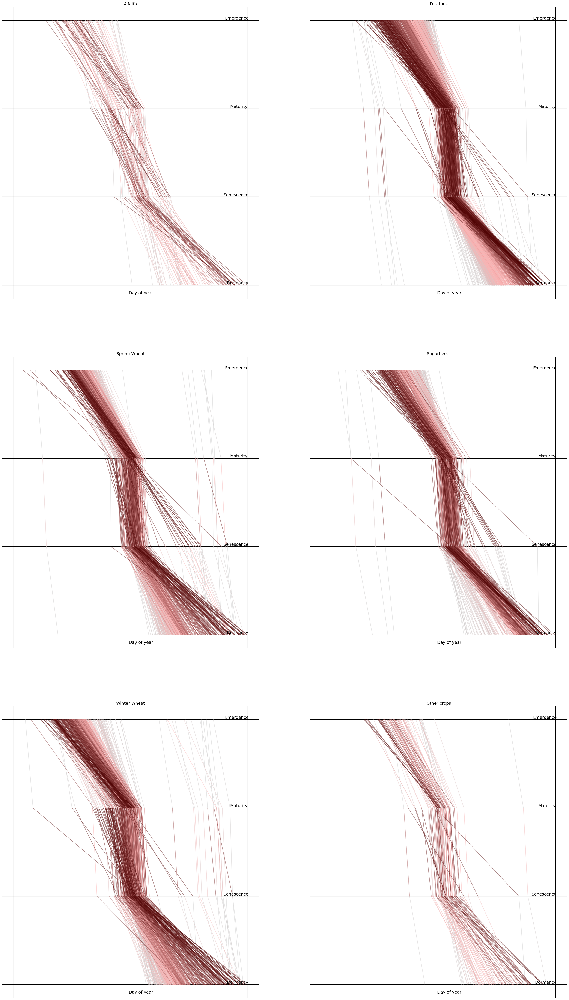

In [10]:
fig, ax = plt.subplots(3, 2, figsize=(34, 60))
ax=ax.flatten()

crops=['Alfalfa', 'Potatoes', 'Spring Wheat', 'Sugarbeets', 'Winter Wheat']
for i,c in enumerate(crops):
    cp_log=pm4py.filtering.filter_event_attribute_values(log, 'Crop', [c])
    plot_ps_ax(cp_log, ax[i], c)
pt_log=pm4py.filtering.filter_event_attribute_values(log, 'Crop', crops,retain=False)
plot_ps_ax(pt_log, ax[-1], 'Other crops')




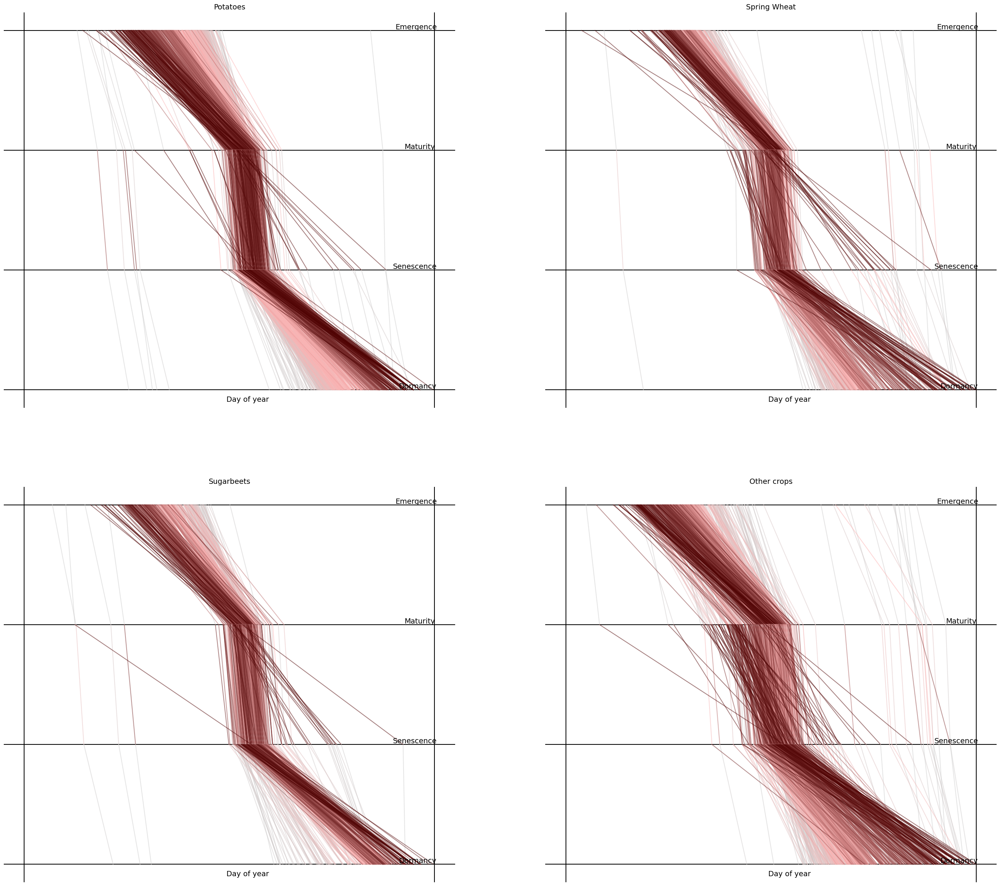

In [99]:
def plot_ps_ax(LG, ax, title=''):
    ax.axhline(y=0,color='k')
    ax.axhline(y=400,color='k')
    ax.axhline(y=800,color='k')
    ax.axhline(y=1200,color='k')
    ax.axvline(x=0,color='k')
    ax.axvline(x=365,color='k')
    ax.text(333, 4, 'Dormancy', fontsize=14, color='k')
    ax.text(328, 404, 'Senescence', fontsize=14, color='k')   
    ax.text(338, 804, 'Maturity', fontsize=14, color='k')
    ax.text(330, 1204, 'Emergence', fontsize=14, color='k')
    em=np.array(LG[LG['Activity']=='Emergence']['doy'])
    ma=np.array(LG[LG['Activity']=='Maturity']['doy'])
    se=np.array(LG[LG['Activity']=='Senescence']['doy'])
    do=np.array(LG[LG['Activity']=='Dormancy']['doy'])

    # Use the exponential steps in your calculation
    num_lines = len(LG['CaseID'].unique())

    red_to_gray = [
        (0.3, 0, 0),
        (1, 0.7, 0.7),
        (0.8, 0.8, 0.8)
    ]
    from matplotlib.colors import LinearSegmentedColormap
    custom_cmap = LinearSegmentedColormap.from_list('red_to_gray', red_to_gray, N=num_lines)
    custom_cmap = custom_cmap.reversed()

    for i,c in zip(np.argsort(ma-em),range(num_lines)):
        x=[em[i],ma[i]]
        y=[1200,800]
        ax.plot(x, y,color=custom_cmap(c), alpha=0.5)

    for i,c in zip(np.argsort(se-ma),range(num_lines)):
        x=[ma[i],se[i]]
        y=[800,400]
        ax.plot(x, y,color=custom_cmap(c), alpha=0.5)

    for i,c in zip(np.argsort(do-se),range(num_lines)):
        x=[se[i],do[i]]
        y=[400,0]
        ax.plot(x, y,color=custom_cmap(c), alpha=0.5)
    ax.axis('off')
    ax.text(180, -40, 'Day of year', fontsize=14, color='k')
    ax.set_title(title, fontsize=14)


crops=['Potatoes', 'Spring Wheat', 'Sugarbeets']
fig, ax = plt.subplots(2, 2, figsize=(34, 30))
ax=ax.flatten()

for i,c in enumerate(crops):
    cp_log=pm4py.filtering.filter_event_attribute_values(log, 'Crop', [c])
    plot_ps_ax(cp_log, ax[i], c)
pt_log=pm4py.filtering.filter_event_attribute_values(log, 'Crop', crops,retain=False)
plot_ps_ax(pt_log, ax[-1], 'Other crops')

In [3]:
#source usda field crops usual planting and harvesting --idaho
#https://downloads.usda.library.cornell.edu/usda-esmis/files/vm40xr56k/dv13zw65p/w9505297d/planting-10-29-2010.pdf
potato_usual=[[pd.Timestamp(2009, 4, 6).dayofyear,pd.Timestamp(2009, 6, 9).dayofyear]
              ,[pd.Timestamp(2009, 8, 15).dayofyear,pd.Timestamp(2009, 10, 27).dayofyear]]

alfalfa_usual=[[0,0]
               ,[pd.Timestamp(2009, 5, 22).dayofyear,pd.Timestamp(2009, 10, 20).dayofyear]]

sugarbeets_usual=[[pd.Timestamp(2009, 3, 24).dayofyear,pd.Timestamp(2009, 5, 5).dayofyear]
                  ,[pd.Timestamp(2009, 9, 15).dayofyear,pd.Timestamp(2009, 11, 10).dayofyear]]

springwheat_usual=[[pd.Timestamp(2009, 3, 21).dayofyear,pd.Timestamp(2009, 5, 26).dayofyear]
                   ,[pd.Timestamp(2009, 8, 4).dayofyear,pd.Timestamp(2009, 9, 29).dayofyear]]

winterwheat_usual=[[pd.Timestamp(2008, 9, 8).dayofyear,pd.Timestamp(2008, 11, 3).dayofyear]
                   ,[pd.Timestamp(2009, 7, 23).dayofyear,pd.Timestamp(2009, 9, 14).dayofyear]]

In [14]:
import pickle
import itertools
tsL=[]
for i in np.arange(0,148,1):
    #loading data
    sid=i
    ts=pd.read_hdf(f'sites3/Site{sid:03}_NBARint.h5')
    ts['doy']=ts.index.dayofyear
    tsL.append(ts)
#cleaning according to CDL
def warn_mark(i,n):
    return f"{i:04}_{n+2007}"
def warn_site_years(Lst):
    threshold=np.nonzero(np.array(Lst[1])<0.75)[0]
    return list(map(lambda x: warn_mark(Lst[0], x), threshold))

with open("C:/Users/Vito/Documents/p1/cdl3/ConsistencyPerc", "rb") as fp:   # Unpickling
    site_consistencyL = pickle.load(fp)

CaseID_anom=list(map(warn_site_years, enumerate(site_consistencyL)))
flat_CaseID_anom = list(itertools.chain.from_iterable(CaseID_anom))
flt_log=pm4py.filtering.filter_event_attribute_values(log, 'CaseID', flat_CaseID_anom,retain=False)

In [27]:
c='Spring Wheat'
cp_log=pm4py.filtering.filter_event_attribute_values(flt_log, 'Crop', [c])

cp_ids=np.unique(cp_log['CaseID'])
#cp_ids=[i for i in cp_ids if not i in flat_CaseID_anom]#filter by consistenct
cp_tslist=[tsL[int(i[:4])].loc[i[5:]] for i in cp_ids]
cp_tsarray=np.vstack([i['mean'] if len(i['doy'])==365 else i['mean'][:-1] for i in cp_tslist])

#all ts for yt year
cp_ids_yt=[i for i in cp_ids if '2020' in i]
cp_tslist_yt=[tsL[int(i[:4])].loc[i[5:]] for i in cp_ids_yt]
cp_tsarray_yt=np.vstack([i['mean'] if len(i['doy'])==365 else i['mean'][:-1] for i in cp_tslist_yt])

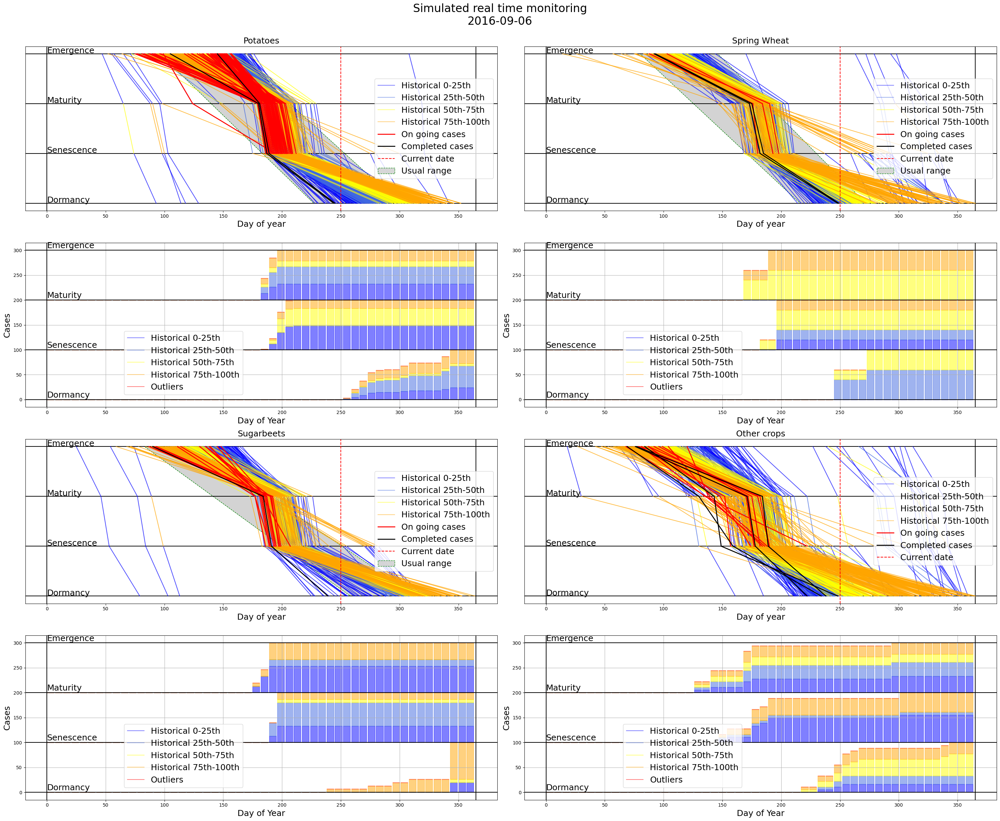

In [43]:
def plot_ps_separate_ax(LG, axi, title='', cutoff=None):
    yt='2016'

    ax[axi].axhline(y=0,color='k')
    ax[axi].axhline(y=400,color='k')
    ax[axi].axhline(y=800,color='k')
    ax[axi].axhline(y=1200,color='k')
    ax[axi].axvline(x=0,color='k')
    ax[axi].axvline(x=365,color='k')
    ax[axi].text(0, 4, 'Dormancy', fontsize=18, color='k')
    ax[axi].text(0, 404, 'Senescence', fontsize=18, color='k')   
    ax[axi].text(0, 804, 'Maturity', fontsize=18, color='k')
    ax[axi].text(0, 1204, 'Emergence', fontsize=18, color='k')
    def sub_ps(em,ma,se,do, axi, cutoff=None):

        def inplot(em,ma,se,do, cmap, alpha=0.5, linewidth=1):
            for i in np.argsort(ma-em):
                x=[em[i],ma[i]]
                y=[1200,800]
                ax[axi].plot(x, y,color=cmap, alpha=alpha, linewidth=linewidth)

            for i in np.argsort(se-ma):
                x=[ma[i],se[i]]
                y=[800,400]
                ax[axi].plot(x, y,color=cmap, alpha=alpha, linewidth=linewidth)

            for i in np.argsort(do-se):
                x=[se[i],do[i]]
                y=[400,0]
                ax[axi].plot(x, y,color=cmap, alpha=alpha,  linewidth=linewidth)
        if cutoff:
            em=np.where(em<cutoff, em, np.nan)
            ma=np.where(ma<cutoff, ma, np.nan)
            se=np.where(se<cutoff, se, np.nan)
            do=np.where(do<cutoff, do, np.nan)
            ax[axi].axvline(x=cutoff,color='r', linestyle='--')
            incomplete=np.isnan(do)
            inplot(em[incomplete],ma[incomplete],se[incomplete],do[incomplete], 'r', 1,2)
            complete=~incomplete
            inplot(em[complete],ma[complete],se[complete],do[complete], 'k', 1,2)
        else:
            inplot(em,ma,se,do, 'k',1,2)
    def hist_ps(em,ma,se,do, axi):
        quartiles=[0,0.25,0.5,0.75,1]
        num_cases=len(em)
        loc=[int(np.rint(x * num_cases)) for x in quartiles]

        colors=['blue','royalblue','yellow','orange']
        allqctlist=[]
        def inplot(em,ma,se,do, pctj1, pctj2, cmap, alpha=0.5):
            qctlist=[]
            for i in np.argsort(ma-em)[pctj1:pctj2]:
                x=[em[i],ma[i]]
                y=[1200,800]
                ax[axi].plot(x, y,color=cmap, alpha=alpha)
            qctlist.append(ma[i]-em[i])
            for i in np.argsort(se-ma)[pctj1:pctj2]:
                x=[ma[i],se[i]]
                y=[800,400]
                ax[axi].plot(x, y,color=cmap, alpha=alpha)
            qctlist.append(se[i]-ma[i])
            for i in np.argsort(do-se)[pctj1:pctj2]:
                x=[se[i],do[i]]
                y=[400,0]
                ax[axi].plot(x, y,color=cmap, alpha=alpha)
            qctlist.append(do[i]-se[i])
            return qctlist
        for j,c in zip(range(4), colors):
            allqctlist.append(inplot(em, ma, se, do, loc[j], loc[j+1], c, 0.7))
        return allqctlist



    em=np.array(LG[LG['Activity']=='Emergence']['doy'])
    ma=np.array(LG[LG['Activity']=='Maturity']['doy'])
    se=np.array(LG[LG['Activity']=='Senescence']['doy'])
    do=np.array(LG[LG['Activity']=='Dormancy']['doy'])
    allqctlist=hist_ps(em,ma,se,do, axi)
    
    yt_LG=LG[LG['Year']==yt]

    em=np.array(yt_LG[yt_LG['Activity']=='Emergence']['doy'])
    ma=np.array(yt_LG[yt_LG['Activity']=='Maturity']['doy'])
    se=np.array(yt_LG[yt_LG['Activity']=='Senescence']['doy'])
    do=np.array(yt_LG[yt_LG['Activity']=='Dormancy']['doy'])
    sub_ps(em,ma,se,do, axi, cutoff)
    if title=='Other crops':
        if cutoff:
            legend_elements = [
                Line2D([0], [0], color='blue', alpha=0.5, label='Historical 0-25th'),
                Line2D([0], [0], color='royalblue', alpha=0.5, label='Historical 25th-50th'),
                Line2D([0], [0], color='yellow', alpha=0.5, label='Historical 50th-75th'),
                Line2D([0], [0], color='orange', alpha=0.5, label='Historical 75th-100th'),
                Line2D([0], [0], color='r',linewidth=2, alpha=1, label='On going cases'),
                Line2D([0], [0],color='k',linewidth=2, alpha=1, label='Completed cases'),
                Line2D([0], [0],color='r', linestyle='--', label='Current date')
            ]
        else:
            legend_elements = [
                Line2D([0], [0], color='blue', alpha=0.5, label='Historical 0-25th'),
                Line2D([0], [0], color='royalblue', alpha=0.5, label='Historical 25th-50th'),
                Line2D([0], [0], color='yellow', alpha=0.5, label='Historical 50th-75th'),
                Line2D([0], [0], color='orange', alpha=0.5, label='Historical 75th-100th'),
                Line2D([0], [0], color='k',linewidth=2, alpha=1, label='Year: '+yt)
            ]
    else:
        if cutoff:
            legend_elements = [
                Line2D([0], [0], color='blue', alpha=0.5, label='Historical 0-25th'),
                Line2D([0], [0], color='royalblue', alpha=0.5, label='Historical 25th-50th'),
                Line2D([0], [0], color='yellow', alpha=0.5, label='Historical 50th-75th'),
                Line2D([0], [0], color='orange', alpha=0.5, label='Historical 75th-100th'),
                Line2D([0], [0], color='r',linewidth=2, alpha=1, label='On going cases'),
                Line2D([0], [0],color='k',linewidth=2, alpha=1, label='Completed cases'),
                Line2D([0], [0],color='r', linestyle='--', label='Current date'),#+(datetime(int(yt), 1, 1) + timedelta(cutoff - 1)).strftime("%Y-%m-%d")),
                Patch(facecolor='lightgrey', alpha=0.9, edgecolor='g', linestyle='--',label='Usual range')
            ]
        else:
            legend_elements = [
                Line2D([0], [0], color='blue', alpha=0.5, label='Historical 0-25th'),
                Line2D([0], [0], color='royalblue', alpha=0.5, label='Historical 25th-50th'),
                Line2D([0], [0], color='yellow', alpha=0.5, label='Historical 50th-75th'),
                Line2D([0], [0], color='orange', alpha=0.5, label='Historical 75th-100th'),
                Line2D([0], [0], color='k',linewidth=2, alpha=2, label='Year: '+yt),
                Patch(facecolor='lightgrey', alpha=0.9, edgecolor='g', linestyle='--',label='Usual range')
            ]
    ax[axi].legend(handles=legend_elements, loc='center right', fontsize=18)
    
    
    ax[axi].get_yaxis().set_visible(False)
    ax[axi].set_xlabel('Day of year', fontsize=18, color='k')
    ax[axi].set_title(title, fontsize=18)

    #plot time series
    axi+=2
    num_cases=len(em)
    ax[axi].axhline(y=0,color='k')
    ax[axi].axhline(y=100,color='k')
    ax[axi].axhline(y=100*2,color='k')
    ax[axi].axhline(y=100*3,color='k')
    ax[axi].axvline(x=0,color='k')
    ax[axi].axvline(x=365,color='k')
    ax[axi].text(0, 4, 'Dormancy', fontsize=18, color='k')
    ax[axi].text(0, 100+4, 'Senescence', fontsize=18, color='k')   
    ax[axi].text(0, 100*2+4, 'Maturity', fontsize=18, color='k')
    ax[axi].text(0, 100*3+4, 'Emergence', fontsize=18, color='k')


    def aggregation(em,ma,se,do,allqctlist):
        emmaL=np.zeros((365,5))
        maseL=np.zeros((365,5))
        sedoL=np.zeros((365,5))

        for j in range(5):
            
            maem=ma-em
            sema=se-ma
            dose=do-se
            allqctlist.append([np.nanmax(maem),np.nanmax(sema),np.nanmax(dose)])
            if j!=0:
                j0=j-1
                for i in np.argsort(maem[(allqctlist[j0][0]<maem)&(maem<=allqctlist[j][0])]):
                    emmaL[ma[i]:,j]+=1
                for i in np.argsort(sema[(allqctlist[j0][1]<sema)&(sema<=allqctlist[j][1])]):
                    maseL[se[i]:,j]+=1
                for i in np.argsort(dose[(allqctlist[j0][2]<dose)&(dose<=allqctlist[j][2])]):
                    sedoL[do[i]:,j]+=1
            else:
                for i in np.argsort(maem[(maem<=allqctlist[j][0])]):
                    emmaL[ma[i]:,j]+=1
                for i in np.argsort(sema[(sema<=allqctlist[j][1])]):
                    maseL[se[i]:,j]+=1
                for i in np.argsort(dose[(dose<=allqctlist[j][2])]):
                    sedoL[do[i]:,j]+=1
        return emmaL, maseL, sedoL
    
    emmaL,maseL,sedoL=aggregation(em,ma,se,do,allqctlist)

    
    def window_pct(Lst,w0,w1,y_lower):
        ylow=np.zeros(7)+y_lower
        fst=np.zeros(7)+(y_lower+Lst[w1,0])
        snd=np.zeros(7)+(y_lower+Lst[w1,0]+Lst[w1,1])
        trd=np.zeros(7)+(y_lower+Lst[w1,0]+Lst[w1,1]+Lst[w1,2])
        fth=np.zeros(7)+(y_lower+Lst[w1,0]+Lst[w1,1]+Lst[w1,2]+Lst[w1,3])
        sth=np.zeros(7)+(y_lower+Lst[w1,0]+Lst[w1,1]+Lst[w1,2]+Lst[w1,3]+Lst[w1,4])
        ax[axi].fill_between(np.arange(w0,w1,1),fst,ylow,alpha=0.5, color='blue')
        ax[axi].fill_between(np.arange(w0,w1,1),snd,fst,alpha=0.5, color='royalblue')
        ax[axi].fill_between(np.arange(w0,w1,1),trd,snd,alpha=0.5, color='yellow')
        ax[axi].fill_between(np.arange(w0,w1,1),fth,trd,alpha=0.5, color='orange')
        ax[axi].fill_between(np.arange(w0,w1,1),sth,fth,alpha=0.5, color='red')
    for wi in np.arange(0,364,7):
        window_pct(emmaL*100/num_cases,wi,wi+7,200)
        window_pct(maseL*100/num_cases,wi,wi+7,100)
        window_pct(sedoL*100/num_cases,wi,wi+7,0)
    legend_elements = [
        Line2D([0], [0], color='blue', alpha=0.5, label='Historical 0-25th'),
        Line2D([0], [0], color='royalblue', alpha=0.5, label='Historical 25th-50th'),
        Line2D([0], [0], color='yellow', alpha=0.5, label='Historical 50th-75th'),
        Line2D([0], [0], color='orange', alpha=0.5, label='Historical 75th-100th'),
        Line2D([0], [0], color='red', alpha=0.5, label='Outliers'),
    ]
    ax[axi].legend(handles=legend_elements, loc='lower left', bbox_to_anchor=(0.2, 0.05), ncol=1, fontsize=18)
    ax[axi].set_ylabel('Cases',fontsize=18)
    ax[axi].set_xlabel('Day of Year',fontsize=18)  
    ax[axi].grid()

crops=['Potatoes', 'Spring Wheat', 'Sugarbeets']
usuals=[np.array(potato_usual), np.array(springwheat_usual), np.array(sugarbeets_usual)]
fig, ax = plt.subplots(4, 2, figsize=(30, 25))
ax=ax.flatten()
plt.suptitle('Simulated real time monitoring\n'+(datetime(2016, 1, 1) + timedelta(250 - 1)).strftime("%Y-%m-%d"),fontsize=24)
ci=0
for i,c in zip([0,1,4,5],crops):
    cp_log=pm4py.filtering.filter_event_attribute_values(flt_log, 'Crop', [c])
    plot_ps_separate_ax(cp_log, i, c, 250)
    ax[i].fill_between(usuals[ci].T.flatten(), [1200,1200,1200,0],[1200,0,0,0], color='lightgrey', edgecolor='g', linestyle='--')#, alpha=0.9)
    ci+=1

pt_log=pm4py.filtering.filter_event_attribute_values(flt_log, 'Crop', crops,retain=False)
plot_ps_separate_ax(pt_log, -3, 'Other crops', 250)

plt.tight_layout(rect=[0, 0, 1, 0.98])

plt.savefig('result\ps_sim.pdf') 
plt.show()